**IMPORTS**

In [1]:
pip install opencv-python numpy matplotlib scikit-learn pandas pillow keras tensorflow



[notice] A new release of pip is available: 23.2.1 -> 23.3.2

[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import os
from PIL import Image
import csv
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, precision_score, accuracy_score, f1_score,recall_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout
import cv2
import pandas as pd
import glob
import time
from io import BytesIO
from keras.applications.vgg16 import VGG16
from keras.models import Model
from keras.layers import Dense
from keras.optimizers import SGD
import plotly.express as px

**Visualization**

In [40]:

import plotly.subplots as sp
import plotly.graph_objects as go
import matplotlib.pyplot as plt


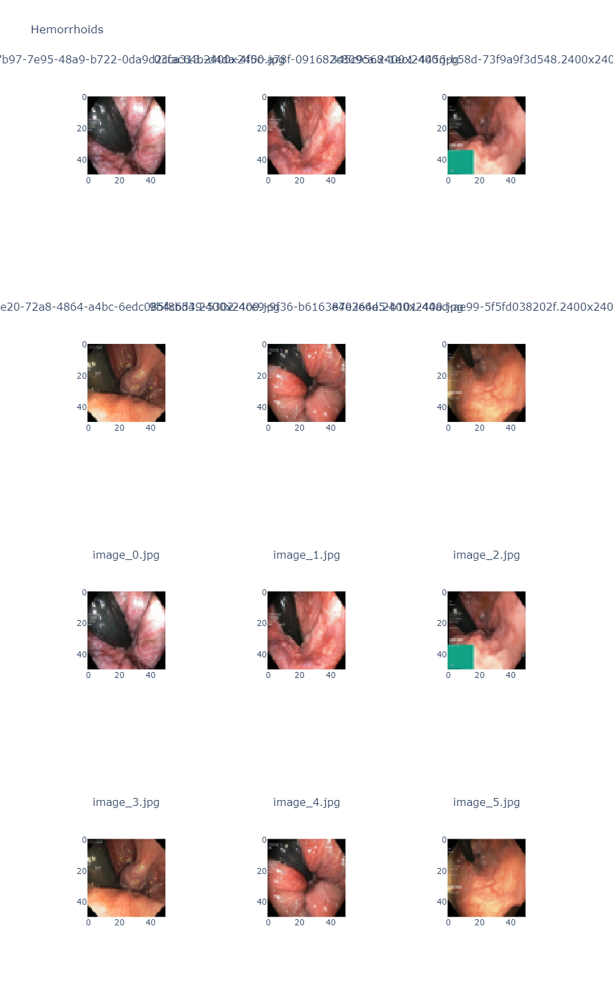

Text(0, 0.5, 'Frequency')

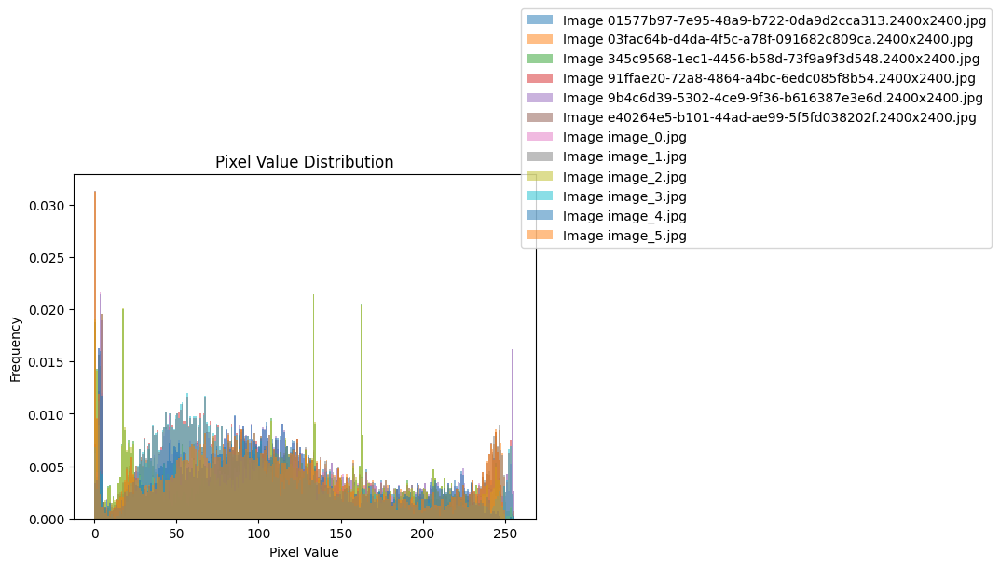

In [62]:


hemorrhoidsPath = 'images lower GI/dataset/hemorrhoids' 

target_size = (50, 50)
hemorrhoidsImages = [f for f in os.listdir(hemorrhoidsPath) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))]

totalImages = len(hemorrhoidsImages)
cols = 3 
rows = (totalImages + cols - 1) // cols

displayed_size = (1500, 1500)
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=hemorrhoidsImages)
image_data=[]
for i, image_file in enumerate(hemorrhoidsImages, start=1):
    image_path = os.path.join(hemorrhoidsPath, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

    fig.add_trace(go.Image(z=np.array(img_resized)), row=(i - 1) // cols + 1, col=(i - 1) % cols + 1)
    fig.update_layout(title_text=f'Subplot {i}', showlegend=False,width=displayed_size[0], height=displayed_size[1])

fig.update_layout(title_text='Hemorrhoids', showlegend=False)
fig.show()

plt.title('Pixel Value Distribution')
plt.legend(loc='best', bbox_to_anchor=(1.5, 1., 0.5, 0.5))
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')


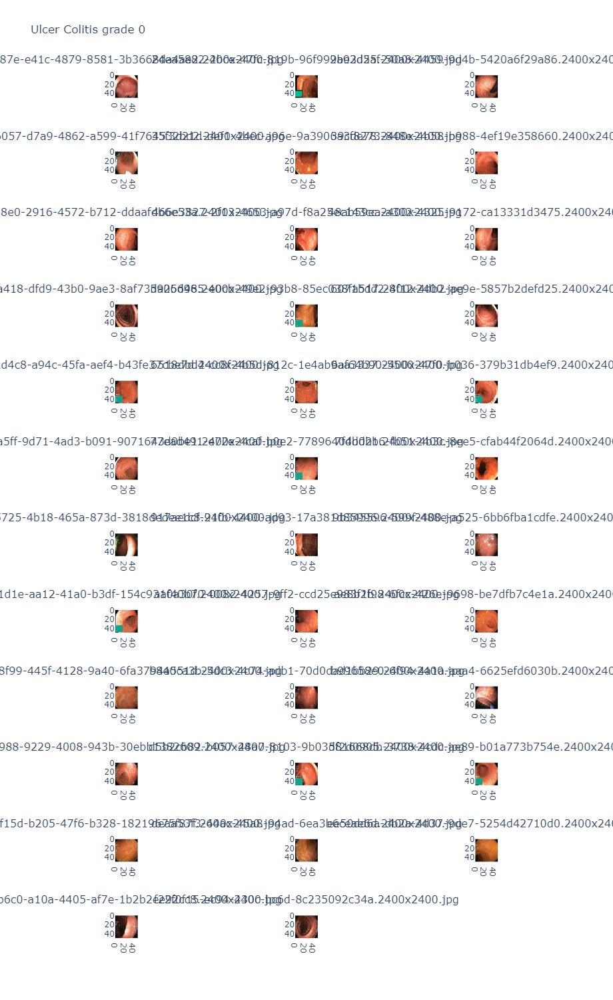

Text(0, 0.5, 'Frequency')

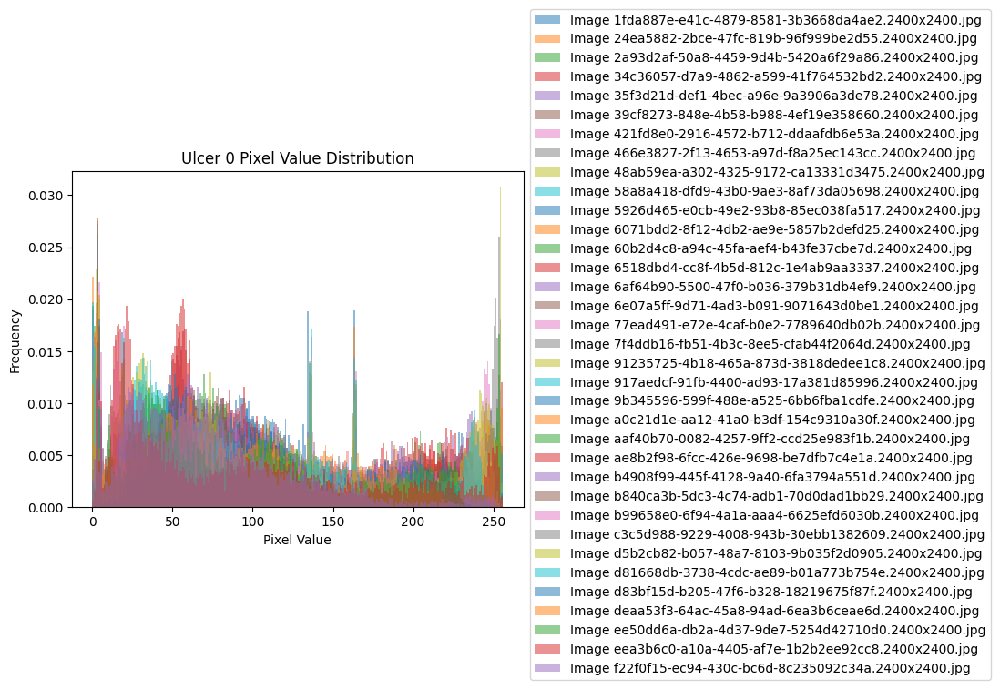

In [53]:
ulcer0Path = 'images lower GI/not polyps/ulcer0'

target_size = (50, 50)
displayed_size = (1500, 1500)
ulcer0Images = [f for f in os.listdir(ulcer0Path) if f.endswith(('.jpg', '.jpeg', '.png', '.gif'))]

totalImages = len(ulcer0Images)
cols = 3
rows = (totalImages + cols - 1) // cols

fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=ulcer0Images)
image_data=[]

for i, image_file in enumerate(ulcer0Images, start=1):
    image_path = os.path.join(ulcer0Path, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

    fig.add_trace(go.Image(z=np.array(img_resized)), row=(i - 1) // cols + 1, col=(i - 1) % cols + 1)
    fig.update_layout(title_text=f'Subplot {i}', showlegend=False, width=displayed_size[0], height=displayed_size[1])

fig.update_layout(title_text='Ulcer Colitis grade 0', showlegend=False)
fig.show()
plt.legend(loc='best', bbox_to_anchor=(1, 1., 0.5, 0.5))

plt.title('Ulcer 0 Pixel Value Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

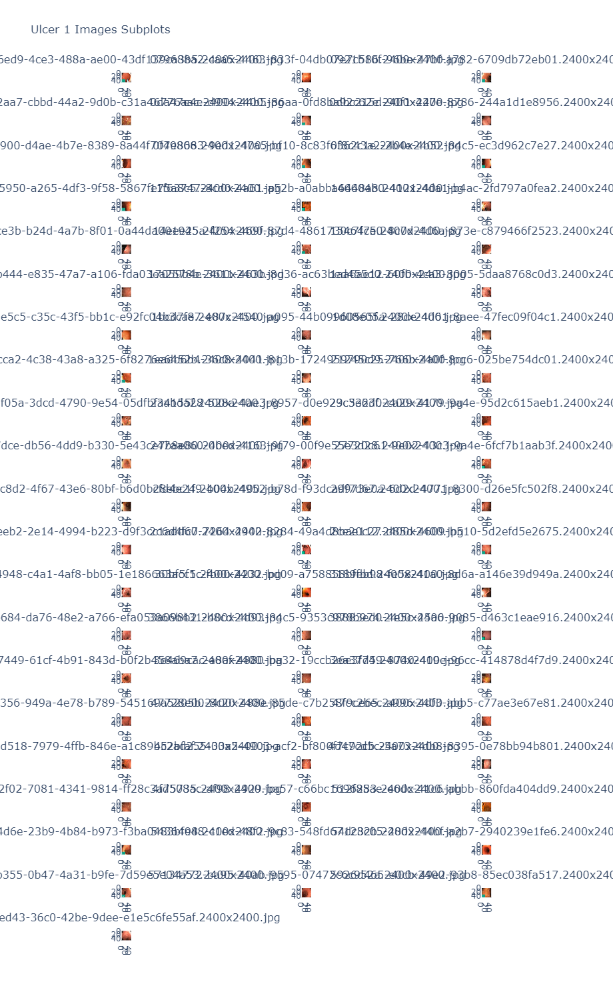

Text(0, 0.5, 'Frequency')

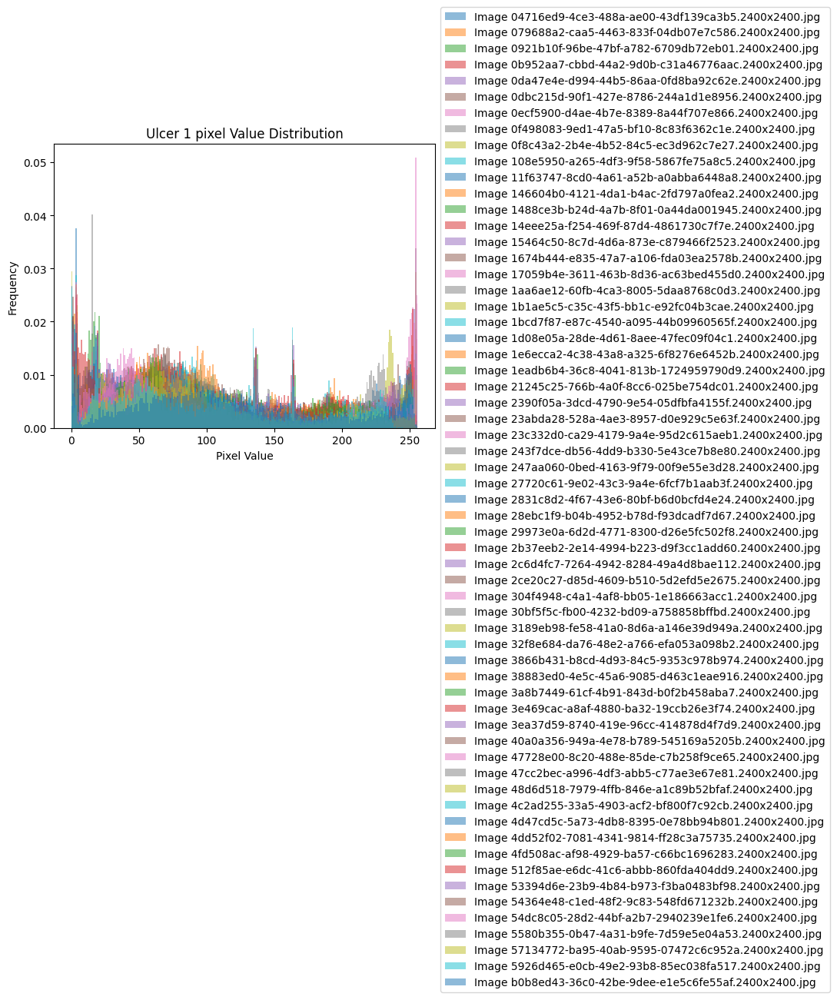

In [54]:

ulcer1Path = 'images lower GI/not polyps/ulcer1'

target_size = (50, 50)
displayed_size = (1920, 1500)
ulcer1Images = [f for f in os.listdir(ulcer1Path) if f.endswith(('.jpg', '.jpeg'))]

totalImages = len(ulcer1Images)
cols = 3 
rows = (totalImages + cols - 1) // cols
image_data=[]
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=ulcer1Images)

for i, image_file in enumerate(ulcer1Images, start=1):
    image_path = os.path.join(ulcer1Path, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

    fig.add_trace(go.Image(z=np.array(img_resized)), row=(i - 1) // cols + 1, col=(i - 1) % cols + 1)
    fig.update_layout(title_text=f'Subplot {i}', showlegend=False, width=displayed_size[0], height=displayed_size[1])

fig.update_layout(title_text='Ulcer 1 Images Subplots', showlegend=False)
fig.show()
plt.legend(loc='best', bbox_to_anchor=(1, 1., 0.5, 0.5))


plt.title('Ulcer 1 pixel Value Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

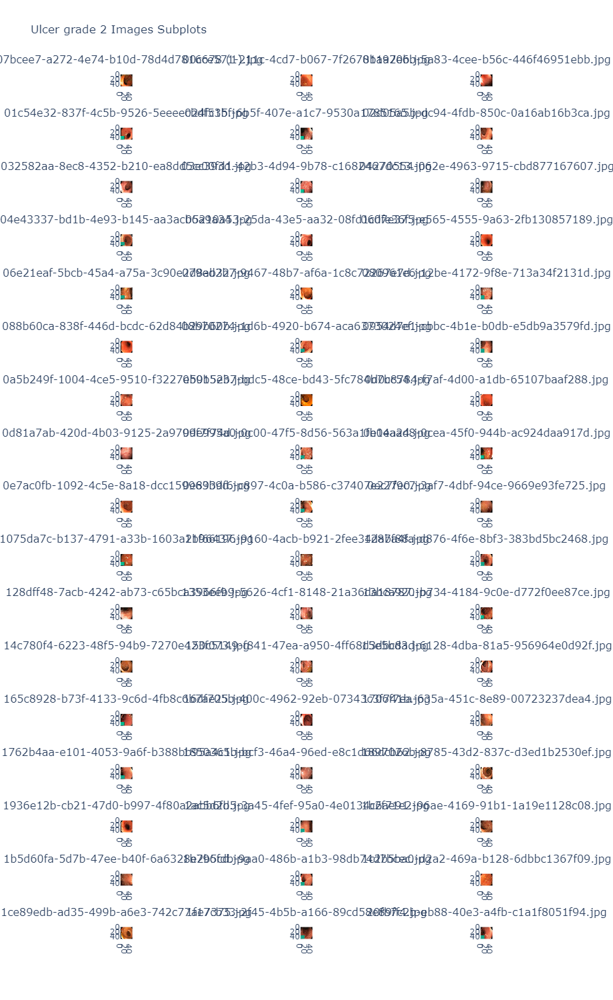

Text(0, 0.5, 'Frequency')

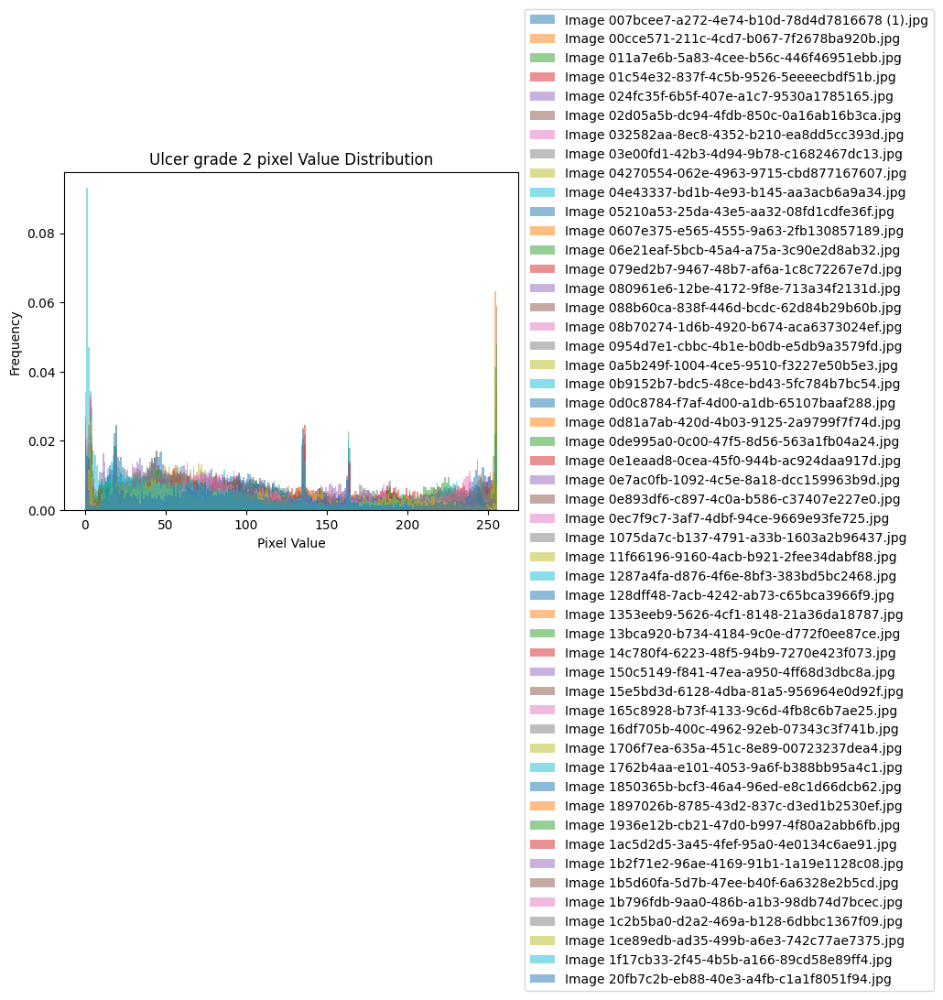

In [57]:
ulcer2Path = 'images lower GI/not polyps/ulcer2'

target_size = (50, 50)
displayed_size = (1920, 1500)
ulcer2Images = [f for f in os.listdir(ulcer2Path) if f.endswith(('.jpg', '.jpeg'))]

totalImages = len(ulcer2Images)
cols = 3
rows = (totalImages + cols - 1) // cols
image_data=[]
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=ulcer2Images)

for i, image_file in enumerate(ulcer2Images, start=1):
    image_path = os.path.join(ulcer2Path, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

    fig.add_trace(go.Image(z=np.array(img_resized)), row=(i - 1) // cols + 1, col=(i - 1) % cols + 1)
    fig.update_layout(title_text=f'Subplot {i}', showlegend=False, width=displayed_size[0], height=displayed_size[1])

fig.update_layout(title_text='Ulcer grade 2 Images Subplots', showlegend=False)
fig.show()
plt.legend(loc='best', bbox_to_anchor=(1, 1., 0.5, 0.5))

plt.title('Ulcer grade 2 pixel Value Distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')

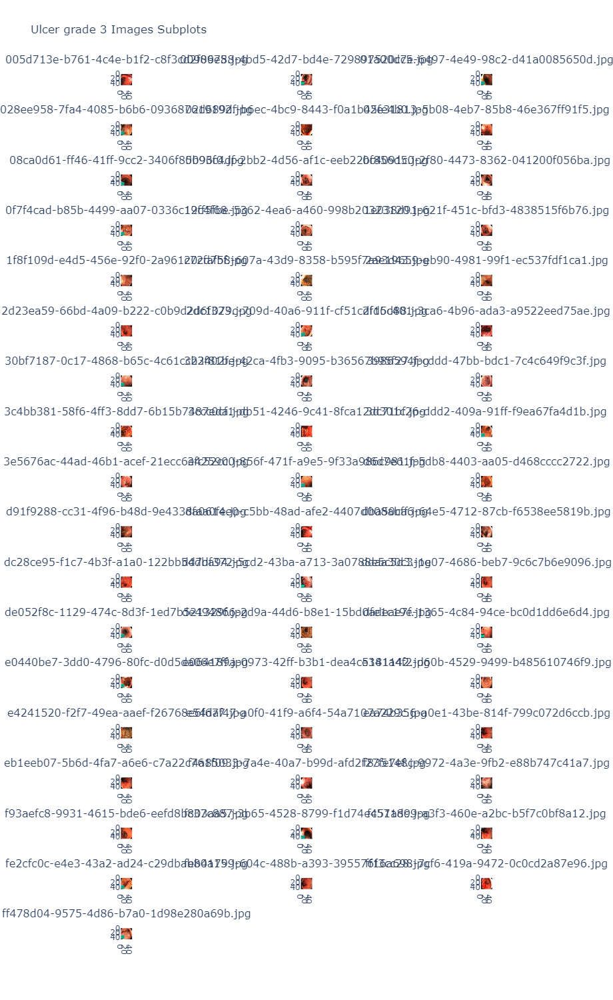

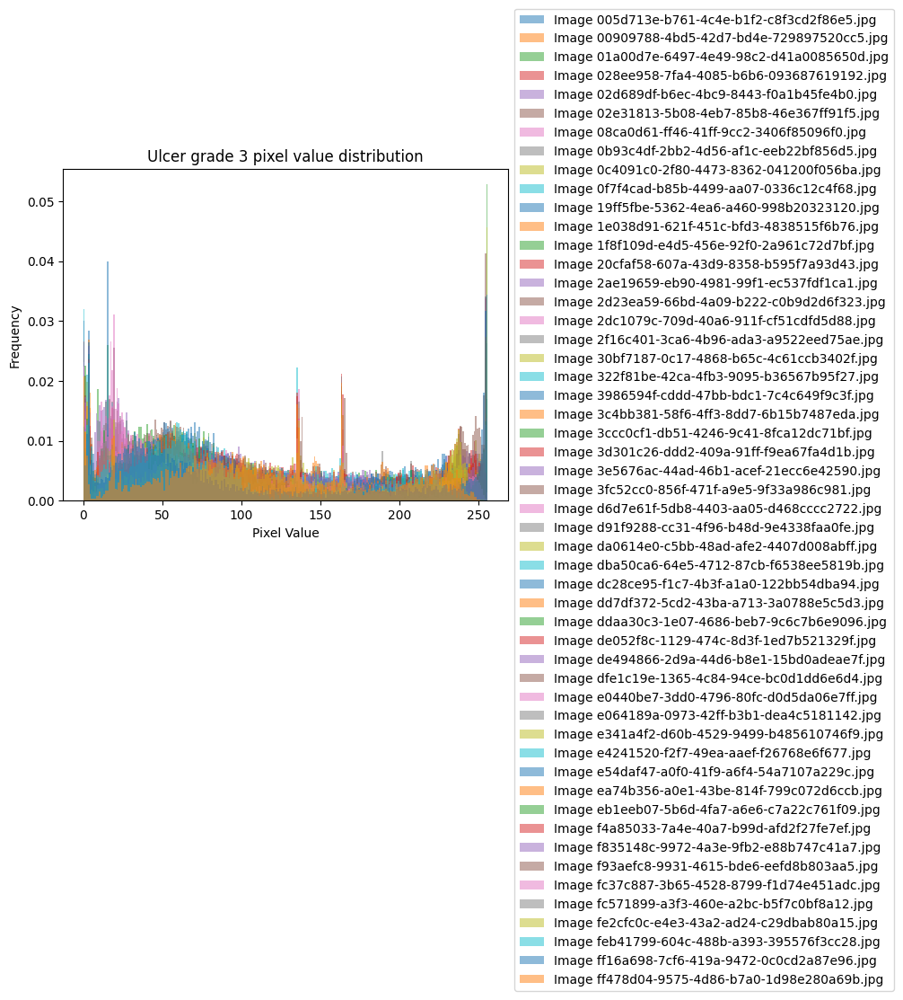

In [59]:
ulcer3Path = 'images lower GI/not polyps/ulcer3'

target_size = (50, 50)
displayed_size = (1920, 1500)
ulcer3Images = [f for f in os.listdir(ulcer3Path) if f.endswith(('.jpg', '.jpeg'))]

totalImages = len(ulcer3Images)
cols = 3 
rows = (totalImages + cols - 1) // cols
image_data=[]
fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=ulcer3Images)

for i, image_file in enumerate(ulcer3Images, start=1):
    image_path = os.path.join(ulcer3Path, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

    fig.add_trace(go.Image(z=np.array(img_resized)), row=(i - 1) // cols + 1, col=(i - 1) % cols + 1)
    fig.update_layout(title_text=f'Subplot {i}', showlegend=False, width=displayed_size[0], height=displayed_size[1])

fig.update_layout(title_text='Ulcer grade 3 Images Subplots', showlegend=False)
fig.show()
plt.legend(loc='best', bbox_to_anchor=(1, 1., 0.5, 0.5))

plt.title('Ulcer grade 3 pixel value distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.show()

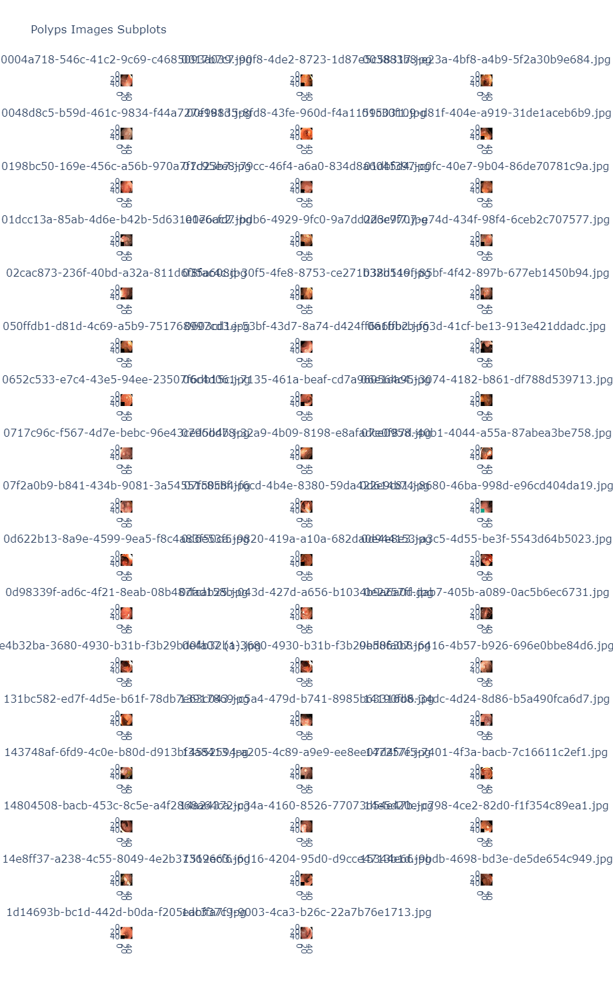

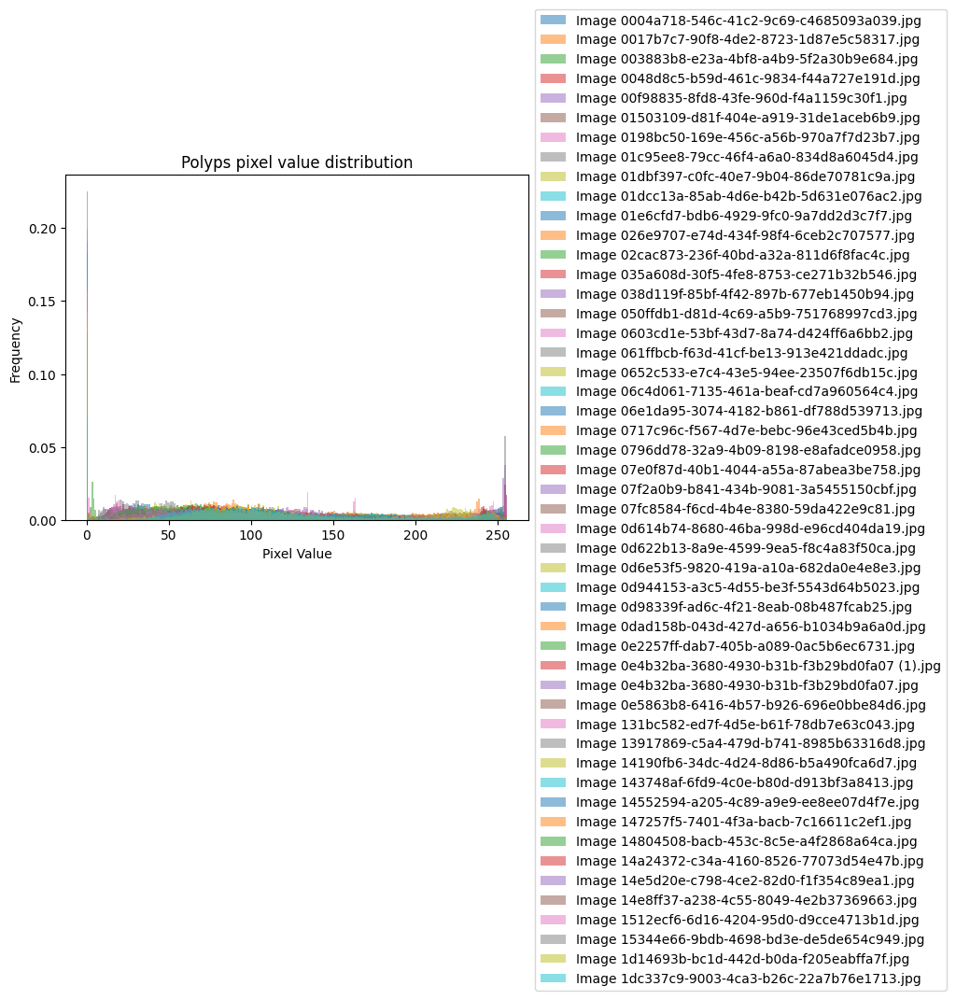

In [60]:

polypsPath = 'images lower GI/polyps'

target_size = (50, 50)
displayed_size = (1920, 1500)
polypsImages = [f for f in os.listdir(polypsPath) if f.endswith(('.jpg', '.jpeg'))]

totalImages = len(polypsImages)
cols = 3 
rows = (totalImages + cols - 1) // cols

fig = sp.make_subplots(rows=rows, cols=cols, subplot_titles=polypsImages)
image_data = []
for i, image_file in enumerate(polypsImages, start=1):
    image_path = os.path.join(polypsPath, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

    fig.add_trace(go.Image(z=np.array(img_resized)), row=(i - 1) // cols + 1, col=(i - 1) % cols + 1)
    fig.update_layout(title_text=f'Subplot {i}', showlegend=False, width=displayed_size[0], height=displayed_size[1])

fig.update_layout(title_text='Polyps Images Subplots', showlegend=False)
fig.show()
plt.title('Polyps pixel value distribution')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend(loc='best', bbox_to_anchor=(1, 1., 0.5, 0.5))


plt.show()

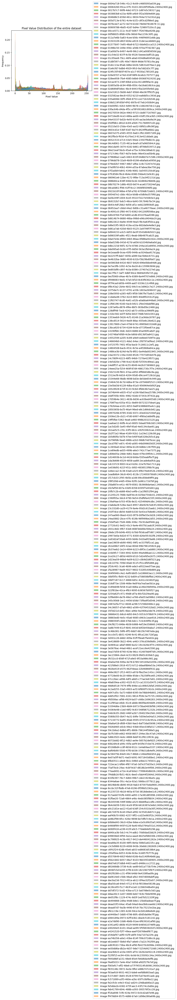

In [61]:
image_data=[]
target_size = (50, 50)
entireDataPath='images lower GI/total data'
entireDataImages = [f for f in os.listdir(entireDataPath) if f.endswith(('.jpg', '.jpeg'))]


entireData=entireDataImages = [f for f in os.listdir(entireDataPath) if f.endswith(('.jpg', '.jpeg'))]
for i, image_file in enumerate(entireDataImages, start=1):
    image_path = os.path.join(entireDataPath, image_file)
    img_original = Image.open(image_path)
    img_resized = img_original.resize(target_size)
    img_array = np.array(img_resized)
    flattened_array = img_array.flatten()

    image_data.append(flattened_array)

    plt.hist(flattened_array, bins=256, range=(0, 256), density=True, alpha=0.5, label=f'Image {image_file}')

plt.title('Pixel Value Distribution of the entire dataset')
plt.xlabel('Pixel Value')
plt.ylabel('Frequency')
plt.legend(loc='best', bbox_to_anchor=(1, 1., 0.5, 0.5))

plt.show()

**DATASET INFERENCE**


In [12]:
def read_images(path):
    images = []
    for filename in os.listdir(path):
        if filename.endswith(".jpg") or filename.endswith(".png"): 
            img = Image.open(os.path.join(path, filename))
            if img is not None:
                images.append(img)
    return images



In [13]:
def rename_and_save_images(folder_path, new_folder_path):
    for idx, filename in enumerate(os.listdir(folder_path)):
        if filename.endswith(".jpg") or filename.endswith(".png"): 
            img = Image.open(os.path.join(folder_path, filename))
            if img is not None:
                new_filename = f"image_{idx}.jpg"
                img.save(os.path.join(new_folder_path, new_filename))

In [15]:
rename_and_save_images(polyps_path, 'images lower GI/dataset/polyps')
rename_and_save_images(ulcer0_path, 'images lower GI/dataset/ulcer0')
rename_and_save_images(ulcer1_path, 'images lower GI/dataset/ulcer1')
rename_and_save_images(ulcer2_path, 'images lower GI/dataset/ulcer2')
rename_and_save_images(ulcer3_path, 'images lower GI/dataset/ulcer3')
rename_and_save_images(hem_path, 'images lower GI/dataset/hemorrhoids')

In [14]:
polyps_path = 'images lower GI/dataset/polyps'
ulcer0_path = 'images lower GI/dataset/ulcer0'
ulcer1_path = 'images lower GI/dataset/ulcer1'
ulcer2_path = 'images lower GI/dataset/ulcer2'
ulcer3_path = 'images lower GI/dataset/ulcer3'
hem_path = 'images lower GI/dataset/hemorrhoids'

polyps = []
polyps = read_images(polyps_path)
ulcer0 = []
ulcer0 = read_images(ulcer0_path)
ulcer1 = []
ulcer1 = read_images(ulcer1_path)
ulcer2 = []
ulcer2 = read_images(ulcer2_path)
ulcer3 = []
ulcer3 = read_images(ulcer3_path)
hem = []
hem = read_images(hem_path)

In [16]:
headers = ['image_name', 'class']

with open('images lower GI/output.csv', 'w', newline='') as f:
    writer = csv.writer(f)
    writer.writerow(headers)
    for i in polyps:
        writer.writerow([polyps, 'polyps'])
    for i in ulcer0:
        writer.writerow([ulcer0, 'ulcer0'])
    for i in ulcer1:
        writer.writerow([ulcer1, 'ulcer1'])
    for i in ulcer2:
        writer.writerow([ulcer2, 'ulcer2'])
    for i in ulcer3:
        writer.writerow([ulcer3, 'ulcer3'])
    for i in hem:
        writer.writerow([hem, 'hemorrhoids'])

In [17]:
df = pd.read_csv('images lower GI/output.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>

RangeIndex: 660 entries, 0 to 659

Data columns (total 2 columns):

 #   Column      Non-Null Count  Dtype 

---  ------      --------------  ----- 

 0   image_name  660 non-null    object

 1   class       660 non-null    object

dtypes: object(2)

memory usage: 10.4+ KB


In [8]:
accuracy_list = []
precision_list = []

In [18]:
def load_images_from_folder(path):
    data = {'style': [], 'image_array': []}

    for foldername in os.listdir(path):
        folderpath = os.path.join(path, foldername)
        if os.path.isdir(folderpath):
            for filename in os.listdir(folderpath):
                file_path = os.path.join(folderpath, filename)
                if filename.endswith(('.jpg', '.png')):
                    try:
                        img = Image.open(file_path)
                        img = img.resize((100, 100))
                        img_array = np.array(img)  # Convert image to array
                        data['style'].append(foldername)
                        data['image_array'].append(img_array)
                    except Exception as e:
                        print(f"Error processing {file_path}: {e}")

    df = pd.DataFrame(data)
    return df

In [19]:
path_original = 'images lower GI/dataset/' #path to folder which contains all the folders of classes


df = load_images_from_folder(path_original)

In [21]:
df.head()

,style,image_array
0,hemorrhoids,"[[[4, 4, 4], [4, 4, 4], [4, 4, 4], [4, 4, 4], ..."
1,hemorrhoids,"[[[4, 4, 4], [4, 4, 4], [4, 4, 4], [4, 4, 4], ..."
2,hemorrhoids,"[[[2, 2, 2], [2, 2, 2], [2, 2, 2], [2, 2, 2], ..."
3,hemorrhoids,"[[[3, 3, 3], [3, 3, 3], [3, 3, 3], [3, 3, 3], ..."
4,hemorrhoids,"[[[4, 4, 4], [4, 4, 4], [4, 4, 4], [4, 4, 4], ..."


In [25]:
def evaluate_classification_metrics_vgg16(model, X_test, y_test, encoder):
    y_pred = np.argmax(model.predict(X_test), axis=1)
    y_true = np.argmax(y_test, axis=1)
    
    accuracy = np.mean(y_true == y_pred)
    print(f"Accuracy: {accuracy}")
    precision = precision_score(y_true, y_pred, average='weighted')
    print(f"Precision: {precision}")
    f1 = f1_score(y_true, y_pred, average='weighted')
    print(f"F1 Score: {f1}")
    recall = recall_score(y_true, y_pred, average='weighted')
    print(f"Recall: {recall}")
    



In [23]:
def train_cnn_on_image_dataframe_vgg16(image_dataframe):
    images = np.array(image_dataframe['image_array'].to_list())
    styles = np.array(image_dataframe['style'])
    encoder = LabelEncoder()
    styles_encoded = encoder.fit_transform(styles)
    styles = np.eye(len(encoder.classes_))[styles_encoded] #one hot encoding 

    X_train, X_test, y_train, y_test = train_test_split(images, styles, test_size=0.2, random_state=42)

    base_model = VGG16(weights='imagenet', include_top=False, input_shape=X_train.shape[1:])
    for layer in base_model.layers:
        layer.trainable = False


    x = Flatten()(base_model.output)
    x = Dense(512, activation='relu')(x)
    x = Dropout(0.5)(x)
    x = Dense(len(encoder.classes_), activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=x)

    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    history = model.fit(X_train, y_train, epochs=18, batch_size=32, validation_data=(X_test, y_test))

    evaluate_classification_metrics_vgg16(model, X_test, y_test, encoder)

    return model, encoder




In [26]:
trained_cnn_vgg16, label_encoder_vgg16 = train_cnn_on_image_dataframe_vgg16(df)

Epoch 1/18

24/24 [==============================] - 52s 2s/step - loss: 18.3725 - accuracy: 0.5570 - val_loss: 4.8590 - val_accuracy: 0.7801

Epoch 2/18

24/24 [==============================] - 57s 2s/step - loss: 4.4403 - accuracy: 0.8152 - val_loss: 2.7164 - val_accuracy: 0.8377

Epoch 3/18

24/24 [==============================] - 30s 1s/step - loss: 1.4118 - accuracy: 0.9004 - val_loss: 2.0556 - val_accuracy: 0.8586

Epoch 4/18

24/24 [==============================] - 38s 2s/step - loss: 0.8116 - accuracy: 0.9240 - val_loss: 1.1488 - val_accuracy: 0.9058

Epoch 5/18

24/24 [==============================] - 38s 2s/step - loss: 0.3936 - accuracy: 0.9463 - val_loss: 0.8618 - val_accuracy: 0.9110

Epoch 6/18

24/24 [==============================] - 35s 1s/step - loss: 0.3683 - accuracy: 0.9620 - val_loss: 1.1924 - val_accuracy: 0.9058

Epoch 7/18

24/24 [==============================] - 34s 1s/step - loss: 0.2979 - accuracy: 0.9594 - val_loss: 1.1974 - val_accuracy: 0.9110

Epoch

c:\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

  _warn_prf(average, modifier, msg_start, len(result))


Accuracy: 0.9214659685863874

Precision: 0.9251311856820621

F1 Score: 0.9141087297964116

Recall: 0.9214659685863874

Since the cost of false negatives is high, we use recall as the most important analysis factor. The current model provides an adequate value of 0.921 which ensures its reliability. 
